# 1. <a id='Introduction'>Introduction 

### Using machine learning models to predict whether a person can develop some type of heart disease can result in an improvement in quality of life and also a powerful business tool. In this notebook we will analising some fators relashionchip teha can leave a individuals develope some heart disease. Besides we will machine learning algorith to predict whether an invidual can develop some type of heart disease with based on several characteristics found in the dataset.

![ass](https://afmc.org/wp-content/uploads/2017/02/heartfailure.jpg)

# 2. <a id='importing'>Importing the necessary libraries

In [2]:
import pandas as pd
import numpy as np
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


# Disable warnings
import warnings
warnings.filterwarnings("ignore")

# Import plotting modules
!pip install chart_studio
import seaborn as sns
sns.set()
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.ticker
import plotly.express as px
from plotly.offline import iplot

import chart_studio.plotly as py
import plotly.graph_objs as go
import cufflinks
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')
%matplotlib inline

warnings.filterwarnings("ignore")
import plotly.figure_factory as ff
from colorama import Fore, Back, Style 

# Import machine learning algorithms
import xgboost
import lightgbm
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

/kaggle/input/mlcourse/medium_posts.csv
/kaggle/input/mlcourse/weights_heights.csv
/kaggle/input/mlcourse/hostel_factors.csv
/kaggle/input/mlcourse/affairs.csv
/kaggle/input/mlcourse/accidental-deaths-in-usa-monthly.csv
/kaggle/input/mlcourse/adult.data.csv
/kaggle/input/mlcourse/samsung_train.txt
/kaggle/input/mlcourse/mlbootcamp5_train.csv
/kaggle/input/mlcourse/flight_delays_test.csv
/kaggle/input/mlcourse/websites_train_sessions.csv
/kaggle/input/mlcourse/microchip_tests.txt
/kaggle/input/mlcourse/samsung_test.txt
/kaggle/input/mlcourse/telecom_churn.csv
/kaggle/input/mlcourse/titanic_train.csv
/kaggle/input/mlcourse/video_games_sales.csv
/kaggle/input/mlcourse/winequality-white.csv
/kaggle/input/mlcourse/ads_hour.csv
/kaggle/input/mlcourse/beauty.csv
/kaggle/input/mlcourse/site_dic.pkl
/kaggle/input/mlcourse/websites_test_sessions.csv
/kaggle/input/mlcourse/currency.csv
/kaggle/input/mlcourse/flight_delays_train.csv
/kaggle/input/mlcourse/adult_train.csv
/kaggle/input/mlcourse/sam

In [3]:
sns.set_context(
    "notebook", 
    font_scale=1.5,       
    rc={ 
        "figure.figsize": (11, 8), 
        "axes.titlesize": 18 
    }
)

from matplotlib import rcParams
rcParams['figure.figsize'] = 11, 8

# 3. <a id='reading'>Reading the dataset.csv

In [4]:
df = pd.read_csv("../input/mlcourse/mlbootcamp5_train.csv")
print(Fore.BLUE + "dataset size: ", df.shape)
df.head(10)

dataset size:  (70000, 13)


,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0
5,8,21914,1,151,67.0,120,80,2,2,0,0,0,0
6,9,22113,1,157,93.0,130,80,3,1,0,0,1,0
7,12,22584,2,178,95.0,130,90,3,3,0,0,1,1
8,13,17668,1,158,71.0,110,70,1,1,0,0,1,0
9,14,19834,1,164,68.0,110,60,1,1,0,0,0,0


### 1. Where  <span style="color:blue"> ap_hi </span> means systolic blood pressure.
### 2. Where <span style="color:blue"> ap_lo </span> means diastolic blood pressure.
### 3. Where <span style="color:blue"> gluc </span> means glucose levels.

In [5]:
print(Fore.BLUE + 'Data information ....................',Style.RESET_ALL)
print(df.info())

Data information .................... 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           70000 non-null  int64  
 1   age          70000 non-null  int64  
 2   gender       70000 non-null  int64  
 3   height       70000 non-null  int64  
 4   weight       70000 non-null  float64
 5   ap_hi        70000 non-null  int64  
 6   ap_lo        70000 non-null  int64  
 7   cholesterol  70000 non-null  int64  
 8   gluc         70000 non-null  int64  
 9   smoke        70000 non-null  int64  
 10  alco         70000 non-null  int64  
 11  active       70000 non-null  int64  
 12  cardio       70000 non-null  int64  
dtypes: float64(1), int64(12)
memory usage: 6.9 MB
None


### We can drop 'id' column

In [6]:
df0 = df.drop('id', axis = 1)

# 4. <a id='basic'>Basic Data Exploration

### Starting by handling some data

In [7]:
df0['age'].value_counts()

19741    32
18236    32
20376    31
20442    31
18253    31
         ..
17768     1
21497     1
15591     1
23672     1
14329     1
Name: age, Length: 8076, dtype: int64

### The age values that occur most frequently are: 197441 days, 18236 days and 20376 days.

In [8]:
df0['height'].value_counts()

165    5853
160    5022
170    4679
168    4399
164    3396
       ... 
81        1
80        1
207       1
76        1
64        1
Name: height, Length: 109, dtype: int64

### The most frequently height are: 165 cm, 160 cm and 170 cm.

In [9]:
df0['weight'].value_counts()

65.0     3850
70.0     3764
68.0     2831
75.0     2740
60.0     2710
         ... 
169.0       1
54.9        1
96.5        1
42.2        1
50.7        1
Name: weight, Length: 287, dtype: int64

### The most frequently weight are: 65 kg, 70 kg and 68 kg.

In [10]:
#identifying missing values
df0.isnull().sum()

age            0
gender         0
height         0
weight         0
ap_hi          0
ap_lo          0
cholesterol    0
gluc           0
smoke          0
alco           0
active         0
cardio         0
dtype: int64

### There not missing values

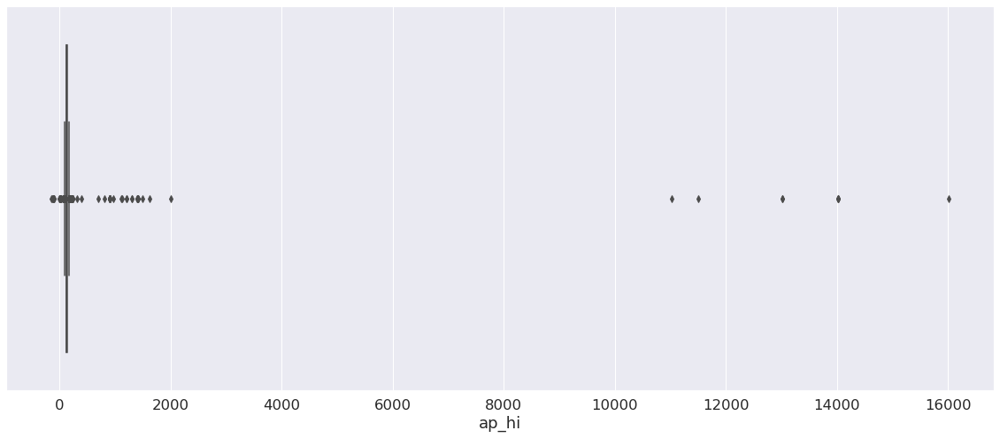

In [48]:
sns.boxplot(data= df0, x = 'ap_hi')
plt.show()

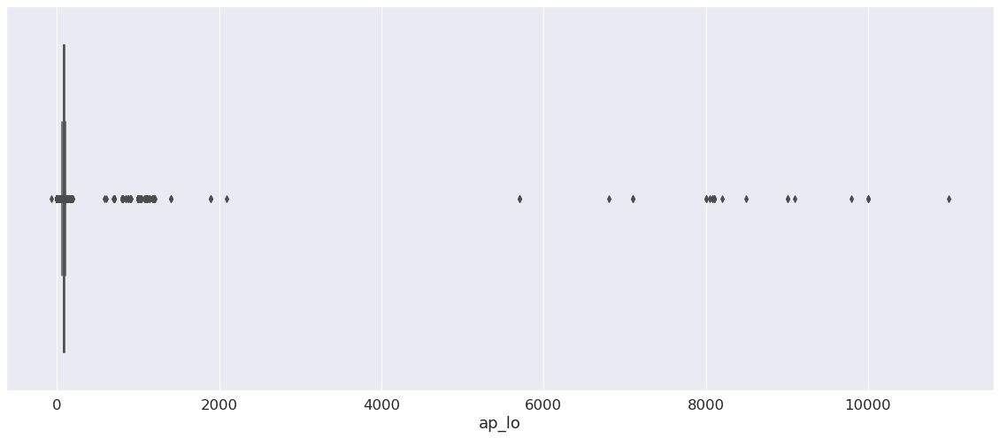

In [49]:
sns.boxplot(data= df0, x = 'ap_lo')
plt.show()

### We have  big outliers into columns 'ap_hi' and 'ap_lo'. Then, we need get rid of them.

In [13]:
# Applying the quantle method
hi_q1 = df0['ap_hi'].quantile(.25)
hi_q3 =df0['ap_hi'].quantile(.75)
iqr = hi_q3 - hi_q1

In [14]:
hi_up = hi_q3 + 1.5*iqr
hi_down = hi_q1 - 1.5*iqr

In [15]:
dff = df0[(df0['ap_hi']> hi_down) & (df0['ap_hi'] < hi_up)]

In [46]:
lo_q1 = dff['ap_lo'].quantile(.25)
lo_q3 =dff['ap_lo'].quantile(.75)
lo_iqr = lo_q3 - lo_q1


In [17]:
lo_up = lo_q3 + 1.5*iqr
lo_down = lo_q1 - 1.5*iqr

In [18]:
dff = dff[(dff['ap_lo']> lo_down) & (dff['ap_lo'] <lo_up)]

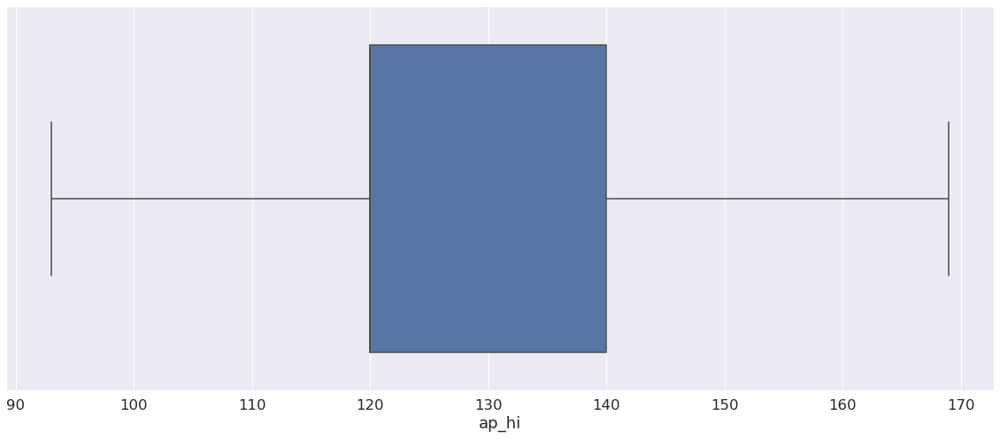

In [51]:
sns.boxplot(data= dff, x = 'ap_hi')
plt.show()

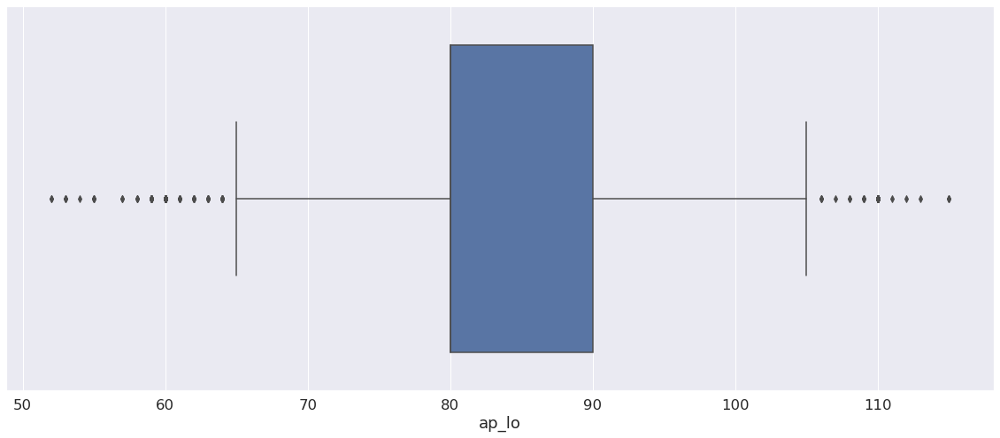

In [52]:
sns.boxplot(data= dff, x = 'ap_lo')
plt.show()

### We significantly reduced data outliers.

### Plotting and analyzing some graphics 

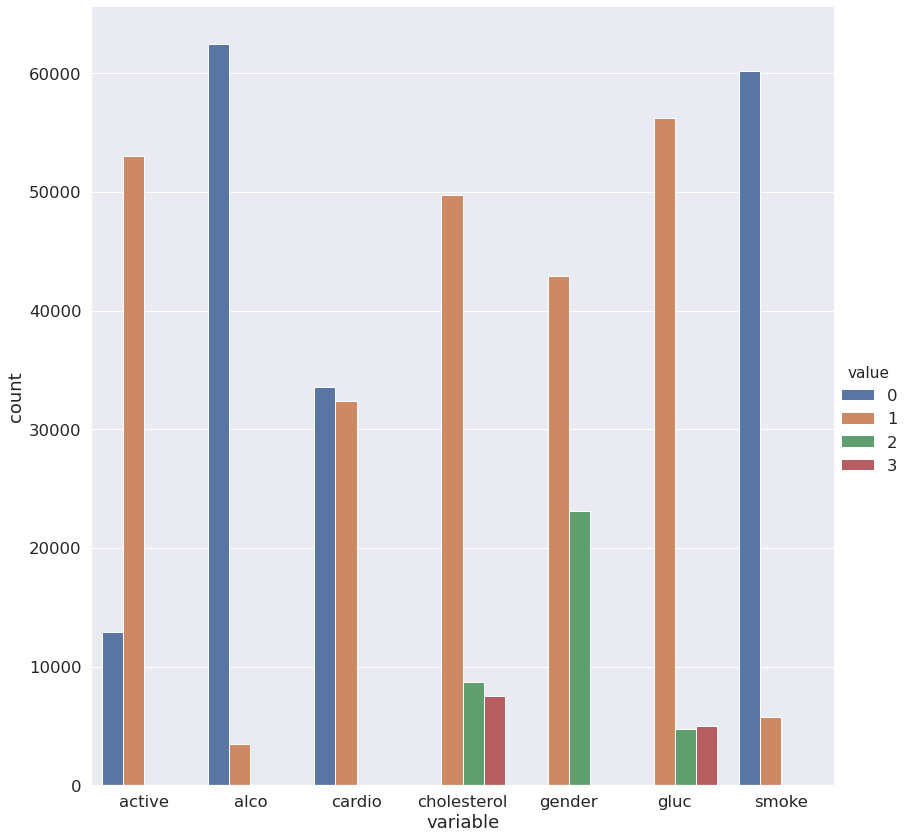

In [20]:
df_uniques = pd.melt(frame=dff, value_vars=['gender','cholesterol', 
                                           'gluc', 'smoke', 'alco', 
                                           'active', 'cardio'])
df_uniques = pd.DataFrame(df_uniques.groupby(['variable', 
                                              'value'])['value'].count()) \
    .sort_index(level=[0, 1]) \
    .rename(columns={'value': 'count'}) \
    .reset_index()

sns.factorplot(x='variable', y='count', hue='value', 
               data=df_uniques, kind='bar', size=12);

### Based on the graphs above, the data shows a considerable imbalance. We see that most individuals practice physical activities, do not consume alcohol regularly, have normal levels of glucose and non-smokers are also prevalent. However, the number of cardios and non-cardios are well balanced. 

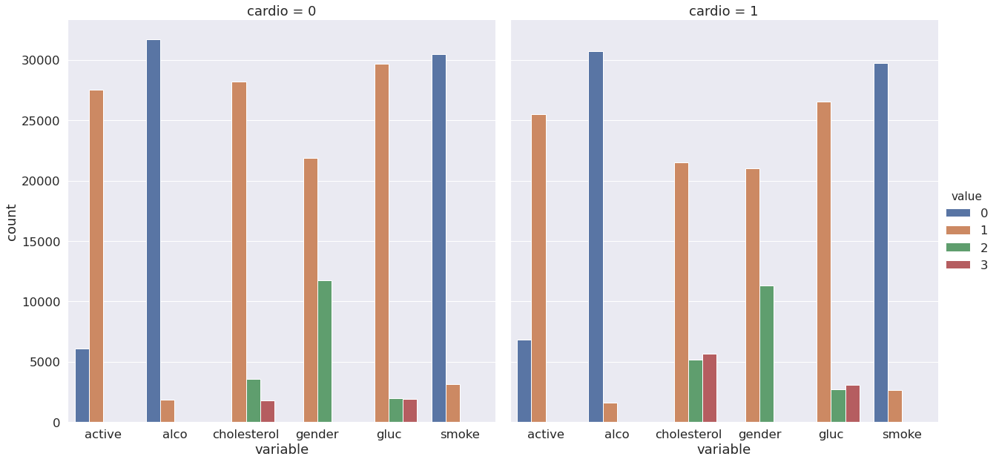

In [21]:
df_uniques = pd.melt(frame=dff, value_vars=['gender','cholesterol', 
                                           'gluc', 'smoke', 'alco', 
                                           'active'], 
                     id_vars=['cardio'])
df_uniques = pd.DataFrame(df_uniques.groupby(['variable', 'value', 
                                              'cardio'])['value'].count()) \
    .sort_index(level=[0, 1]) \
    .rename(columns={'value': 'count'}) \
    .reset_index()

sns.factorplot(x='variable', y='count', hue='value', 
               col='cardio', data=df_uniques, kind='bar', size=9);

### In the graph above when comparing the features of cardios and non-cardios, we see that the number of individuals with higher levels of cholesterol, glucose and sendentarism are greater than the number of non-cardio individuals, these being the most relevant factors. Surprisingly, there is not much difference between the levels of alcohol consumption and smokers when comparing cardio individuals with non-cardio individuals. This may be related to the low number of individuals with these characteristics when comparing the total number of individuals.

# 5. <a id='details'>Data Exploration in Details

In [22]:
dff['age'].iplot(kind='hist',
                              xTitle='Age(Days)', 
                              yTitle='Quantidade',
                              linecolor='black', 
                              opacity=0.7,
                              color='#FB8072',
                              theme='pearl',
                              bargap=0.2,
                              gridcolor='white',
                              title='Age distribution')

In [23]:
fig = px.histogram(dff, x="age", color="cardio", marginal="violin", hover_data=dff.columns)
fig.show()

### In this graph we see the distribution of the number of non-cardio and cardio individuals with respect to age. As is to be expected, the number of individual cardios increases as the number of healthy individuals decreases with advancing age

In [24]:
fig = px.scatter(dff, x="weight", y="age", color='cardio')
fig.show()

### It is clear that there is a direct relationship between age and overweight with individuals who have a heart problem.


In [25]:
fig = px.scatter(dff, x="height", y="age", color='cardio')
fig.show()

### The distribution of ages with heights, as shown in the graph, is relatively homogeneous. It seems that there is a region with individuals aged between 14,000 and 16,000 days (~ 38 years and ~ 44 years) and with heights of between 1.45m and 1.74m have a lower incidence with heart disease.

In [26]:

fig = px.scatter(dff, x=dff['ap_hi'], y="age", color='cardio')
fig.show()

In [27]:
fig = px.scatter(dff, x="ap_lo", y="age", color='cardio')
fig.show()

### We can see from the last two graphs above that the frequency of people with heart disease is proporcional hight pressure blood levels and ages.

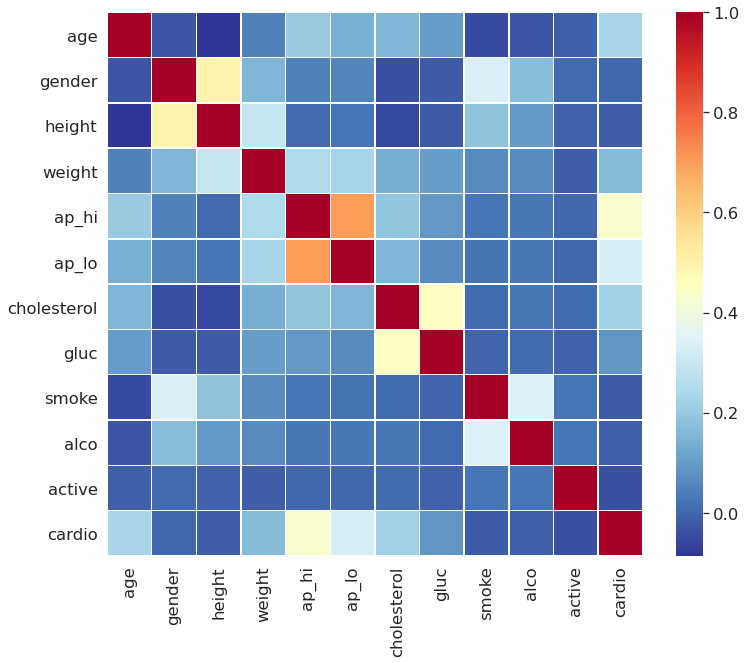

In [28]:
# Ploting the relationship that the fetures of each column have with each other
corrmat = dff.corr() 
f, ax = plt.subplots(figsize =(12, 10)) 
sns.heatmap(corrmat, ax = ax, cmap = 'RdYlBu_r', linewidths = 0.5) 

### the features have a relatively homogeneous correlation behavior and the more strong correlation behavior are found in 'height' with 'gender', 'ap_hi' with 'ap_lo', 'cluc' with 'cholesterol' and 'smoke' with 'alco'. The more strong correlation between cardio factor and the others factors were 'age', 'weight', 'cholesterol', 'gluc', 'ap_hi' and 'ap_lo'.

# 6. <a id='details'> Using machine learning to predict heart disease


### We will use machine learning models to predict how likely an individual is to be cardio or not based on the data.

In [29]:
#Splitting the dataset into features and target
y = dff["cardio"]
x = dff.drop("cardio", axis = 1)

In [30]:
#Splitting the data into test data and training data
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3)


In [31]:
accuracy_list = []

In [32]:
# Decision Tree Classifier

dt_clf = DecisionTreeClassifier(max_leaf_nodes=10, random_state=30, criterion='entropy')
dt_clf.fit(x_train, y_train)
dt_pred = dt_clf.predict(x_test)
dt_acc = dt_clf.score(x_test,y_test)
accuracy_list.append(100*dt_acc)

In [33]:
print(Fore.GREEN + "Accuracy of Decision Tree Classifier is : ", "{:.2f}%".format(100* dt_acc))

Accuracy of Decision Tree Classifier is :  72.41%


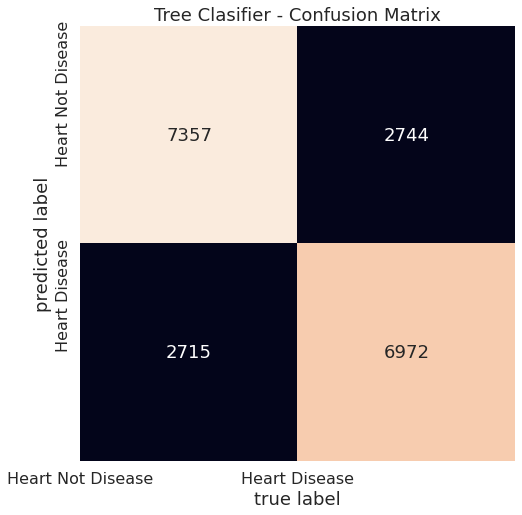

In [34]:
# Confusion matrix of Decision Tree Classifier
from sklearn.metrics import confusion_matrix
mat = confusion_matrix(y_test, dt_pred)
sns.heatmap(mat.T, square=True, annot=True,fmt="d", cbar = False)
plt.title("Tree Clasifier - Confusion Matrix")
plt.xticks(range(2), ["Heart Not Disease","Heart Disease"], fontsize=16)
plt.yticks(range(2), ["Heart Not Disease","Heart Disease"], fontsize=16)
plt.xlabel("true label")
plt.ylabel("predicted label");

In [35]:
# K Neighbors Classifier

kn_clf = KNeighborsClassifier(n_neighbors=6)
kn_clf.fit(x_train, y_train)
kn_pred = kn_clf.predict(x_test)
kn_acc = kn_clf.score(x_test,y_test)
accuracy_list.append(100*kn_acc)


In [36]:
print(Fore.GREEN + "Accuracy of K Neighbors Classifier is : ", "{:.2f}%".format(100* kn_acc))

Accuracy of K Neighbors Classifier is :  67.66%


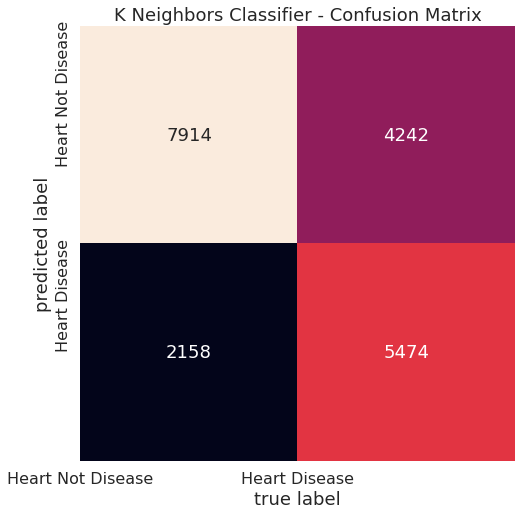

In [37]:
# Confusion matrix of  K Neighbors Classifier
from sklearn.metrics import confusion_matrix
mat = confusion_matrix(y_test, kn_pred)
sns.heatmap(mat.T, square=True, annot=True,fmt="d", cbar = False)
plt.xlabel("true label")
plt.ylabel("predicted label")
plt.title("K Neighbors Classifier - Confusion Matrix")
plt.xticks(range(2), ["Heart Not Disease","Heart Disease"], fontsize=16)
plt.yticks(range(2), ["Heart Not Disease","Heart Disease"], fontsize=16);

In [38]:
# RandomForestClassifier
r_clf = RandomForestClassifier(max_features=0.5, max_depth=15, random_state=1)
r_clf.fit(x_train, y_train)
r_pred = r_clf.predict(x_test)
r_acc = r_clf.score(x_test,y_test)
accuracy_list.append(100*r_acc)

In [39]:
print(Fore.GREEN + "Accuracy of Random Forest Classifier is : ", "{:.2f}%".format(100* r_acc))

Accuracy of Random Forest Classifier is :  72.75%


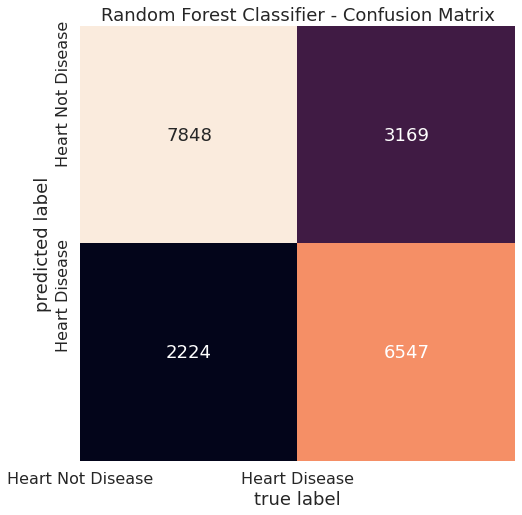

In [40]:
# Confusion matrix of Random Forest Classifier 
from sklearn.metrics import confusion_matrix
mat = confusion_matrix(y_test, r_pred)
sns.heatmap(mat.T, square=True, annot=True,fmt="d", cbar = False)
plt.xlabel("true label")
plt.ylabel("predicted label")
plt.title("Random Forest Classifier - Confusion Matrix")
plt.xticks(range(2), ["Heart Not Disease","Heart Disease"], fontsize=16)
plt.yticks(range(2), ["Heart Not Disease","Heart Disease"], fontsize=16);

In [41]:
# GradientBoostingClassifier

gradientboost_clf = GradientBoostingClassifier(max_depth=2, random_state=4)
gradientboost_clf.fit(x_train,y_train)
gradientboost_pred = gradientboost_clf.predict(x_test)
gradientboost_acc = gradientboost_clf.score(x_test,y_test)
accuracy_list.append(100*gradientboost_acc)

In [42]:
print(Fore.GREEN + "Accuracy of Gradient Boosting is : ", "{:.2f}%".format(100* gradientboost_acc))

Accuracy of Gradient Boosting is :  72.90%


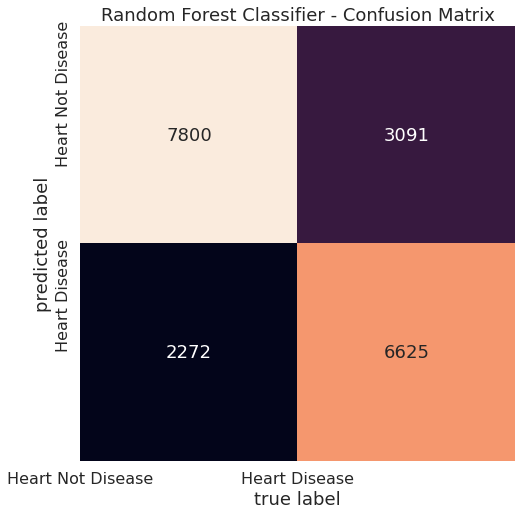

In [43]:
# Confusion matrix of Gradient Boosting
from sklearn.metrics import confusion_matrix
mat = confusion_matrix(y_test, gradientboost_pred)
sns.heatmap(mat.T, square=True, annot=True,fmt="d", cbar = False)
plt.xlabel("true label")
plt.ylabel("predicted label")
plt.title("Random Forest Classifier - Confusion Matrix")
plt.xticks(range(2), ["Heart Not Disease","Heart Disease"], fontsize=16)
plt.yticks(range(2), ["Heart Not Disease","Heart Disease"], fontsize=16);

In [44]:
model_list = ['DecisionTree', 'KNearestNeighbours', 'RandomForest', 'GradientBooster']

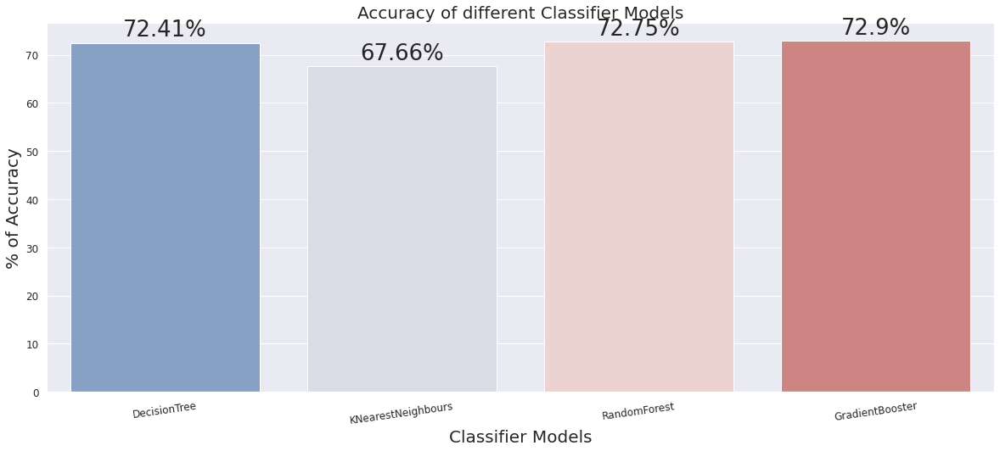

In [45]:
plt.rcParams['figure.figsize']=20,8
sns.set_style('darkgrid')
ax = sns.barplot(x=model_list, y=accuracy_list, palette = "vlag", saturation =2.0)
plt.xlabel('Classifier Models', fontsize = 20 )
plt.ylabel('% of Accuracy', fontsize = 20)
plt.title('Accuracy of different Classifier Models', fontsize = 20)
plt.xticks(fontsize = 12, horizontalalignment = 'center', rotation = 8)
plt.yticks(fontsize = 12)
for i in ax.patches:
    width, height = i.get_width(), i.get_height()
    x, y = i.get_xy() 
    ax.annotate(f'{round(height,2)}%', (x + width/2, y + height*1.02), ha='center', fontsize = 'x-large')
plt.show()

### We tested four machine learning models, Decision Tree, KNearest Neighbors, Random Forest and Gradient Booster. As compiled in the graph above, Gradient Booster proved to be the best forecasting model for our data. Although, with the exception of the KNearest Neighbor model, all others have similar accuracy.

# 7. <a id='Conclusion'> Conclusion

### </p> Based on our data analysis we were able to explore different relationships of people who have some type of heart disease with other diverse factors. The data show that individuals who are overweight, high cholesterol, high glucose and hypertension are the most likely to have some type of heart problem.</p> 

### By using the machine learning algorithms we get a prediction model to detect individuals who have a heart disease with an accuracy of around 73%. Taking into account that the data are based on still very superficial information regarding the factors that can lead to some heart disease, we obtain a model with reasonable accuracy.